### Google Gemini Overview

uv add ipykernel

uv add google-genai

uv add pillow

## Initilization

In [1]:
from google import genai
import os
from getpass import getpass

# Configure the API key
os.environ["GOOGLE_API_KEY"] = os.getenv("GOOGLE_API_KEY") or getpass(
    "Enter Google API Key: "
)

client = genai.Client()

response = client.models.generate_content(
    model='gemini-2.0-flash-exp', contents='How does AI work?'
)
print(response.text)

ImportError: The requests library is not installed from please install the requests package to use the requests transport.

In [3]:
from google import genai

client = genai.Client(http_options={'api_version': 'v1alpha'})
model_id = "gemini-2.0-flash-exp"
config = {"response_modalities": ["TEXT"]}

message = "Hey Gemini!"

async with client.aio.live.connect(model=model_id, config=config) as session:
    print("> ", message, "\n")
    await session.send(message, end_of_turn=True)

    async for response in session.receive():
        print(response.text)

>  Hey Gemini! 

Hey
 there! How can I help you today? What's on your mind?


None


In [4]:
from google.genai.types import Tool, GenerateContentConfig, GoogleSearch

google_search_tool = Tool(
    google_search = GoogleSearch()
)

response = client.models._generate_content(
    model=model_id,
    contents="When is the next total solar eclipse in the United States?",
    config=GenerateContentConfig(
        tools=[google_search_tool],
        response_modalities=["TEXT"],
    )
)

for each in response.candidates[0].content.parts:
    print(each.text)
# Example response:
# The next total solar eclipse visible in the contiguous United States will be on ...

# To get grounding metadata as web content.
print(response.candidates[0].grounding_metadata.search_entry_point.rendered_content)

The next total solar eclipse in the United States will occur on **March 30, 2033**, but it will only be visible in Alaska.

The next total solar eclipse visible in the contiguous United States will be on **August 22, 2044**. The path of totality will only be visible in three states: Montana, North Dakota, and South Dakota.

Following that, another total solar eclipse will cross the entire country on **August 12, 2045**, running from northern California to Florida.

The most recent total solar eclipse in the United States was on April 8, 2024.

<style>
.container {
  align-items: center;
  border-radius: 8px;
  display: flex;
  font-family: Google Sans, Roboto, sans-serif;
  font-size: 14px;
  line-height: 20px;
  padding: 8px 12px;
}
.chip {
  display: inline-block;
  border: solid 1px;
  border-radius: 16px;
  min-width: 14px;
  padding: 5px 16px;
  text-align: center;
  user-select: none;
  margin: 0 8px;
  -webkit-tap-highlight-color: transparent;
}
.carousel {
  overflow: auto;
  s

In [5]:
from google.genai import types

In [6]:
def get_news(location: str,) -> int:
  """Returns the current news.

  Args:
    location: The country, ie America
  """
  return 'The Matrix has taken over the world'

response = client.models.generate_content(
    model='gemini-2.0-flash-exp',
    contents="what is the news like in America",
    config=types.GenerateContentConfig(tools=[get_news],)
)

response.text

'The Matrix has taken over the world.\n'

compute tokens not supported

In [7]:
response = client.models.count_tokens(
    model='gemini-2.0-flash-exp',
    contents='What is your name?',
)
print(response)

total_tokens=6 cached_content_token_count=None


## Defining Variables for Draw Calls Later

In [8]:
bounding_box_system_instructions = """
    Return bounding boxes as a JSON array with labels. Never return masks or code fencing. Limit to 25 objects.
    If an object is present multiple times, name them according to their unique characteristic (colors, size, position, unique characteristics, etc..).
      """
describe_image_instructions = """
    Use the image to help you answer your question, return a string, limit 50 words.
      """
     

safety_settings = [
    types.SafetySetting(
        category="HARM_CATEGORY_DANGEROUS_CONTENT",
        threshold="BLOCK_ONLY_HIGH",
    ),
]

In [9]:
from PIL import Image

import io
import os
import requests
from io import BytesIO

In [10]:
import json
import random
import io
from PIL import Image, ImageDraw, ImageFont
from PIL import ImageColor

additional_colors = [colorname for (colorname, colorcode) in ImageColor.colormap.items()]

def plot_bounding_boxes(im, bounding_boxes):
    """
    Plots bounding boxes on an image with markers for each a name, using PIL, normalized coordinates, and different colors.

    Args:
        img_path: The path to the image file.
        bounding_boxes: A list of bounding boxes containing the name of the object
         and their positions in normalized [y1 x1 y2 x2] format.
    """

    # Load the image
    img = im
    width, height = img.size
    print(img.size)
    # Create a drawing object
    draw = ImageDraw.Draw(img)

    # Define a list of colors
    colors = [
    'red',
    'green',
    'blue',
    'yellow',
    'orange',
    'pink',
    'purple',
    'brown',
    'gray',
    'beige',
    'turquoise',
    'cyan',
    'magenta',
    'lime',
    'navy',
    'maroon',
    'teal',
    'olive',
    'coral',
    'lavender',
    'violet',
    'gold',
    'silver',
    ] + additional_colors

    # We parse out the markdown fencing
    bounding_boxes = parse_json(bounding_boxes)

    # Iterate over the bounding boxes
    for i, bounding_box in enumerate(json.loads(bounding_boxes)):
      # Select a color from the list
      color = colors[i % len(colors)]

      # Convert normalized coordinates to absolute coordinates
      abs_y1 = int(bounding_box["box_2d"][0]/1000 * height)
      abs_x1 = int(bounding_box["box_2d"][1]/1000 * width)
      abs_y2 = int(bounding_box["box_2d"][2]/1000 * height)
      abs_x2 = int(bounding_box["box_2d"][3]/1000 * width)

      if abs_x1 > abs_x2:
        abs_x1, abs_x2 = abs_x2, abs_x1

      if abs_y1 > abs_y2:
        abs_y1, abs_y2 = abs_y2, abs_y1

      # Draw the bounding box
      draw.rectangle(
          ((abs_x1, abs_y1), (abs_x2, abs_y2)), outline=color, width=4
      )

      # Draw the text
      if "label" in bounding_box:
        draw.text((abs_x1 + 8, abs_y1 + 6), bounding_box["label"], fill=color)

    # Display the image
    img.show()

In [11]:
def parse_json(json_output):
    # We parse out the markdown fencing
    lines = json_output.splitlines()
    for i, line in enumerate(lines):
        if line == "```json":
            json_output = "\n".join(lines[i+1:])  # Remove everything before "```json"
            json_output = json_output.split("```")[0]  # Remove everything after the closing "```"
            break  # Exit the loop once "```json" is found
    return json_output

## LangGraph QA on Text + Image 

Here we are setting up our variables that will pass through the graph, we have the question for the user's query, the content which is what we will put our jpg image into, and the result which is what the LLM will fill out for us.

In [12]:
from typing_extensions import TypedDict

class State(TypedDict):
    question: str
    content: str
    result: str  

Now we need to create the functions that our node will be using:

Draw function will open the image, and then pass the image into the gemini LLM to create coordinates for where the boxes should go around the image.

Describe function will do the same as the draw function, however this has a different set of instructions also being passed into the gemini LLM, which allows us to do seperate executions.

Show command should show the image on your media player.

Decide image just looks at your question and decides weather it is better fitted towards going down the describe route or the draw route.

In [13]:
from io import BytesIO
from PIL import Image

ImageTool = Image

def draw(state):
    print("---   Node Draw   ---")

    image_path = state['content']

    # Load and resize image
    with open(image_path, "rb") as image_file:
        img = ImageTool.open(BytesIO(image_file.read()))
        im = img.resize((1024, int(1024 * img.size[1] / img.size[0])), ImageTool.Resampling.LANCZOS)

    # Run model to find bounding boxes
    response = client.models.generate_content(
        model='gemini-2.0-flash-exp',
        contents=[state['question'], im],
        config=types.GenerateContentConfig(
            system_instruction=bounding_box_system_instructions,
            temperature=0.5,
            safety_settings=safety_settings,
        )
    )

    return {"result": response.text}

def show(state):
    print("---   Node Show   ---")

    image = state['content']
    
    # Load and resize image
    img = ImageTool.open(BytesIO(open(image, "rb").read()))
    im = ImageTool.open(image).resize((1024, int(1024 * img.size[1] / img.size[0])), ImageTool.Resampling.LANCZOS)

    plot_bounding_boxes(im, state["result"])
    im.show

    return {"result": "I have completed your drawing"}

def describe(state):
    print("---   Node Describe   ---")

    image_path = state['content']

    # Load and resize image
    with open(image_path, "rb") as image_file:
        img = ImageTool.open(BytesIO(image_file.read()))
        im = img.resize((1024, int(1024 * img.size[1] / img.size[0])), ImageTool.Resampling.LANCZOS)

    # Run model to find bounding boxes
    response = client.models.generate_content(
        model='gemini-2.0-flash-exp',
        contents=[state['question'], im],
        config=types.GenerateContentConfig(
            system_instruction=describe_image_instructions,
            temperature=0.5,
            safety_settings=safety_settings,
        )
    )

    print(response.text)

    return {"result": response.text}

def decide(state):
    print("---   Node Decide   ---")

    response = client.models.generate_content(
        model='gemini-2.0-flash-exp',
        contents="Describe if this question is for drawing or describing an image, if it is for describing, i want you to reply with 'describe' and if its drawing I want you to reply with 'draw' do not use any other words, here is the question: " + state['question'],
        config=types.GenerateContentConfig()
    )

    print(response.text)

    return {"result": response.text}




This decide state is the router used in the langgraph, it justs makes the result from the decide node function super simple incase the LLM decided to put a capital or something silly on the result.

In [14]:
from typing import Literal

def decide_state(state) -> Literal["draw", "describe"]:
    
    user_input = state['result'].strip().lower()
    
    if user_input == "draw":

        return "draw"
    
    return "describe"

Now we want to build the graph, to begin will import our libraries, and then we want to user the builder to add nodes, edges, and compile the graph.

In [15]:
from IPython.display import Image, display
from langgraph.graph import StateGraph, START, END

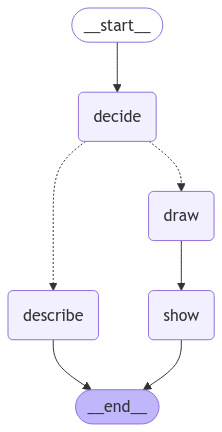

In [16]:
# Build graph
builder = StateGraph(State)

builder.add_node("decide", decide)
builder.add_node("draw", draw)
builder.add_node("describe", describe)
builder.add_node("show", show)

# Logic
builder.add_edge(START, "decide")
builder.add_conditional_edges("decide", decide_state)
builder.add_edge("draw", "show")
builder.add_edge("describe", END)
builder.add_edge("show", END)

# Add
graph = builder.compile()

# View
display(Image(graph.get_graph().draw_mermaid_png()))

Here you can enter your different images and questions. If you would like to use a seperate image make sure you place it next to the notebook so you can call it like this.

In [17]:
image_url = "Cat.jpg"
image_question = "what city is in the background, if you cannot answer give us your best guess"

# describe to me what is in this image
# draw a box around the ...

This does keep getting internal errors, however my code is perfect so it cannot be my fault, must be that trillion dollar company google's fault

In [21]:
graph.invoke({"question" : image_question, "content" : image_url})

---   Node Decide   ---
describe

---   Node Describe   ---
Based on the architecture, the city in the background appears to be New York City. Specifically, it looks like a view of buildings in Brooklyn.


{'question': 'what city is in the background, if you cannot answer give us your best guess',
 'content': 'Cat.jpg',
 'result': 'Based on the architecture, the city in the background appears to be New York City. Specifically, it looks like a view of buildings in Brooklyn.'}

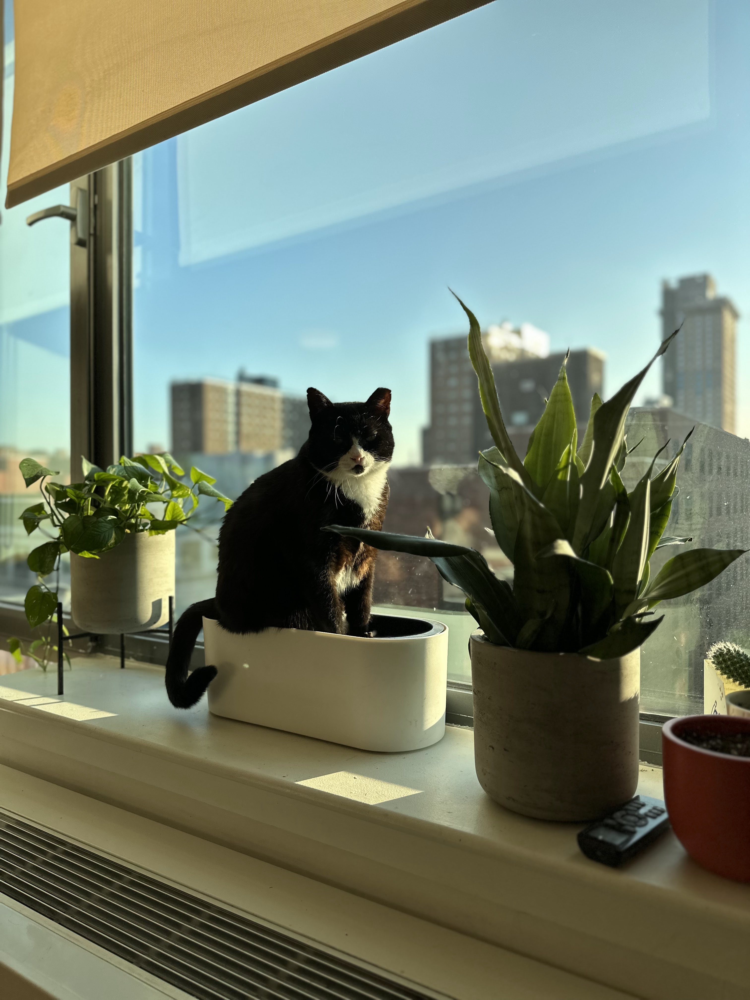

In [159]:
im = ImageTool.open(image_url)
im

In [22]:
#@title Point visualization code

import IPython

def parse_json(json_output):
    # We parse out the markdown fencing
    lines = json_output.splitlines()
    for i, line in enumerate(lines):
        if line == "```json":
            json_output = "\n".join(lines[i+1:])  # Remove everything before "```json"
            json_output = json_output.split("```")[0]  # Remove everything after the closing "```"
            break  # Exit the loop once "```json" is found
    return json_output

def generate_point_html(pil_image, points_json):
    # Convert PIL image to base64 string
    import base64
    from io import BytesIO
    buffered = BytesIO()
    pil_image.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode()
    points_json = parse_json(points_json)

    return f"""
<!DOCTYPE html>
<html>
<head>
    <title>Point Visualization</title>
    <style>
        body {{
            margin: 0;
            padding: 0;
            background: #fff;
            color: #000;
            font-family: -apple-system, BlinkMacSystemFont, 'Segoe UI', Roboto, sans-serif;
        }}

        .point-overlay {{
            position: absolute;
            top: 0;
            left: 0;
            width: 100%;
            height: 100%;
            pointer-events: none;
        }}

        .point {{
            position: absolute;
            width: 12px;
            height: 12px;
            background-color: #2962FF;
            border: 2px solid #fff;
            border-radius: 50%;
            transform: translate(-50%, -50%);
            box-shadow: 0 0 40px rgba(41, 98, 255, 0.6);
            opacity: 0;
            transition: all 0.3s ease-in;
            pointer-events: auto;
        }}

        .point.visible {{
            opacity: 1;
        }}

        .point.fade-out {{
            animation: pointFadeOut 0.3s forwards;
        }}

        .point.highlight {{
            transform: translate(-50%, -50%) scale(1.1);
            background-color: #FF4081;
            box-shadow: 0 0 40px rgba(255, 64, 129, 0.6);
            z-index: 100;
        }}

        @keyframes pointFadeOut {{
            from {{
                opacity: 1;
            }}
            to {{
                opacity: 0.7;
            }}
        }}

        .point-label {{
            position: absolute;
            background-color: #2962FF;
            color: #fff;
            font-size: 14px;
            padding: 4px 12px;
            border-radius: 4px;
            transform: translate(20px, -10px);
            white-space: nowrap;
            opacity: 0;
            transition: all 0.3s ease-in;
            box-shadow: 0 0 30px rgba(41, 98, 255, 0.4);
            pointer-events: auto;
            cursor: pointer;
        }}

        .point-label.visible {{
            opacity: 1;
        }}

        .point-label.fade-out {{
            opacity: 0.45;
        }}

        .point-label.highlight {{
            background-color: #FF4081;
            box-shadow: 0 0 30px rgba(255, 64, 129, 0.4);
            transform: translate(20px, -10px) scale(1.1);
            z-index: 100;
        }}
    </style>
</head>
<body>
    <div id="container" style="position: relative;">
        <canvas id="canvas" style="background: #000;"></canvas>
        <div id="pointOverlay" class="point-overlay"></div>
    </div>

    <script>
        function annotatePoints(frame) {{
            // Add points with fade effect
            const pointsData = {points_json};

            const pointOverlay = document.getElementById('pointOverlay');
            pointOverlay.innerHTML = '';

            const points = [];
            const labels = [];

            pointsData.forEach(pointData => {{
                // Skip entries without coodinates.
                if (!(pointData.hasOwnProperty("point")))
                  return;

                const point = document.createElement('div');
                point.className = 'point';
                const [y, x] = pointData.point;
                point.style.left = `${{x/1000.0 * 100.0}}%`;
                point.style.top = `${{y/1000.0 * 100.0}}%`;

                const pointLabel = document.createElement('div');
                pointLabel.className = 'point-label';
                pointLabel.textContent = pointData.label;
                point.appendChild(pointLabel);

                pointOverlay.appendChild(point);
                points.push(point);
                labels.push(pointLabel);

                setTimeout(() => {{
                    point.classList.add('visible');
                    pointLabel.classList.add('visible');
                }}, 0);

                // Add hover effects
                const handleMouseEnter = () => {{
                    // Highlight current point and label
                    point.classList.add('highlight');
                    pointLabel.classList.add('highlight');

                    // Fade out other points and labels
                    points.forEach((p, idx) => {{
                        if (p !== point) {{
                            p.classList.add('fade-out');
                            labels[idx].classList.add('fade-out');
                        }}
                    }});
                }};

                const handleMouseLeave = () => {{
                    // Remove highlight from current point and label
                    point.classList.remove('highlight');
                    pointLabel.classList.remove('highlight');

                    // Restore other points and labels
                    points.forEach((p, idx) => {{
                        p.classList.remove('fade-out');
                        labels[idx].classList.remove('fade-out');
                    }});
                }};

                point.addEventListener('mouseenter', handleMouseEnter);
                point.addEventListener('mouseleave', handleMouseLeave);
                pointLabel.addEventListener('mouseenter', handleMouseEnter);
                pointLabel.addEventListener('mouseleave', handleMouseLeave);
            }});
        }}

        // Initialize canvas
        const canvas = document.getElementById('canvas');
        const ctx = canvas.getContext('2d');
        const container = document.getElementById('container');

        // Load and draw the image
        const img = new Image();
        img.onload = () => {{
            const aspectRatio = img.height / img.width;
            canvas.width = 800;
            canvas.height = Math.round(800 * aspectRatio);
            container.style.width = canvas.width + 'px';
            container.style.height = canvas.height + 'px';

            ctx.drawImage(img, 0, 0, canvas.width, canvas.height);

            frame.width = canvas.width;
            frame.height = canvas.height;
            annotatePoints(frame);
        }};
        img.src = 'data:image/png;base64,{img_str}';

        const frame = {{
            width: canvas.width,
            height: canvas.height
        }};

        annotatePoints(frame);
    </script>
</body>
</html>
"""

In [25]:
# Load and resize image
img = ImageTool.open("Cat.jpg")
img = img.resize((800, int(800 * img.size[1] / img.size[0])), ImageTool.Resampling.LANCZOS) # Resizing to speed-up rendering

# Analyze the image using Gemini
image_response = client.models.generate_content(
    model='gemini-2.0-flash-exp',
    contents=[
        img,
        """
          Point to no more than 10 items in the image, include cat.
          The answer should follow the json format: [{"point": <point>, "label": <label1>}, ...]. The points are in [y, x] format normalized to 0-1000.
        """
    ],
    config = types.GenerateContentConfig(
        temperature=0.5
    )
)

# Check response
print(image_response.text)

```json
[
  {"point": [500, 802], "label": "plant"},
  {"point": [616, 106], "label": "plant"},
  {"point": [541, 340], "label": "cat"},
    {"point": [614, 501], "label": "planter"},
  {"point": [732, 837], "label": "remote"},
  {"point": [723, 944], "label": "planter"},
  {"point": [232, 150], "label": "window"},
  {"point": [135, 433], "label": "blind"},
    {"point": [680, 244], "label": "cat tail"},
  {"point": [350, 710], "label": "building"}
]
```




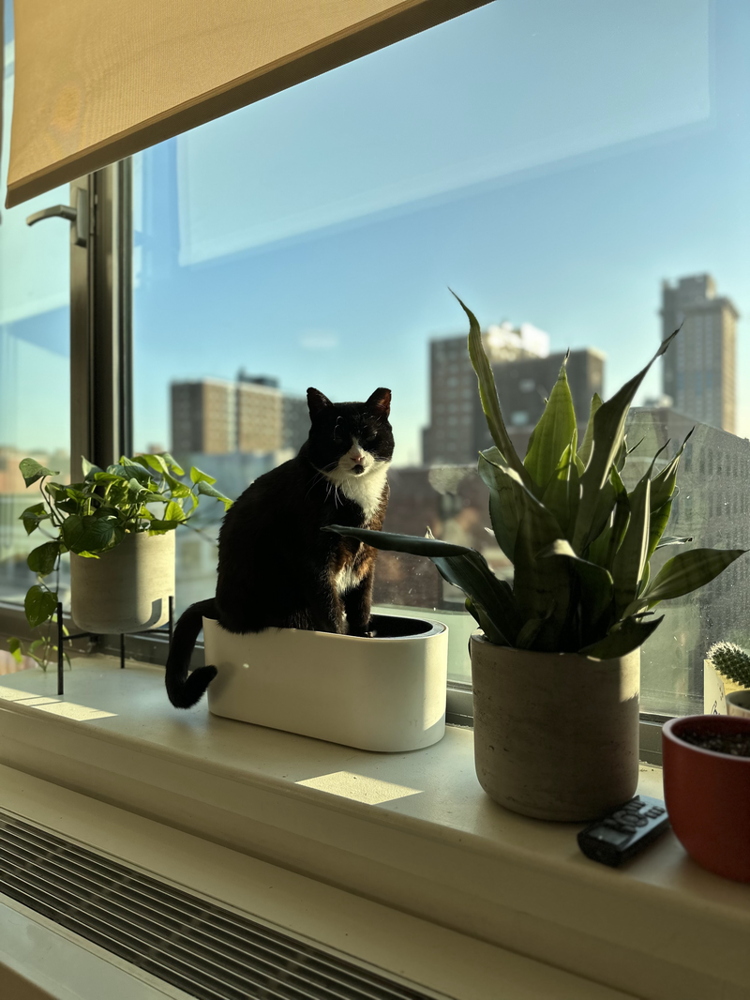

In [26]:
# Display the dots on the image
IPython.display.HTML(generate_point_html(img, image_response.text))

In [45]:
#@title 3D box visualization code

import IPython

def parse_json(json_output):
    # We parse out the markdown fencing
    lines = json_output.splitlines()
    for i, line in enumerate(lines):
        if line == "```json":
            json_output = "\n".join(lines[i+1:])  # Remove everything before "```json"
            json_output = json_output.split("```")[0]  # Remove everything after the closing "```"
            break  # Exit the loop once "```json" is found
    return json_output

def generate_3d_box_html(pil_image, boxes_json):
    # Convert PIL image to base64 string
    import base64
    from io import BytesIO
    buffered = BytesIO()
    pil_image.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode()
    boxes_json = parse_json(boxes_json)

    return f"""
<!DOCTYPE html>
<html>
<head>
    <title>3D Box Visualization</title>
    <style>
        body {{
            margin: 0;
            padding: 0;
            background: #fff;
            color: #000;
            font-family: -apple-system, BlinkMacSystemFont, 'Segoe UI', Roboto, sans-serif;
        }}

        .view-container {{
            display: flex;
            gap: 20px;
            padding: 20px;
            flex-direction: column;
            align-items: center;
        }}

        .canvas-container {{
            display: flex;
            gap: 20px;
        }}

        .box-line {{
            position: absolute;
            background: #2962FF;
            transform-origin: 0 0;
            opacity: 1;
            box-shadow: 0 0 30px rgba(41, 98, 255, 0.4);
            transition: all 0.3s ease;
            pointer-events: none;
        }}

        .box-line.highlight {{
            background: #FF4081;
            box-shadow: 0 0 30px rgba(255, 64, 129, 0.4);
            z-index: 100;
            border-color: #FF4081 !important;
        }}

        .box-line.fade {{
            opacity: 0.3;
        }}

        .box-label {{
            position: absolute;
            color: white;
            font-size: 12px;
            font-family: Arial;
            transform: translate(-50%, -50%);
            opacity: 1;
            background: #2962FF;
            padding: 2px 8px;
            border-radius: 4px;
            box-shadow: 0 0 30px rgba(41, 98, 255, 0.4);
            transition: all 0.3s ease;
            cursor: pointer;
            z-index: 1000;
        }}

        .box-label.highlight {{
            background: #FF4081;
            box-shadow: 0 0 30px rgba(255, 64, 129, 0.4);
            transform: translate(-50%, -50%) scale(1.1);
            z-index: 1001;
        }}

        .box-label.fade {{
            opacity: 0.3;
        }}

        .box-overlay {{
            position: absolute;
            top: 0;
            left: 0;
            width: 100%;
            height: 100%;
            pointer-events: none;
        }}

        .box-overlay .box-label {{
            pointer-events: auto;
        }}

        .controls {{
            margin-top: 10px;
            background: rgba(0,0,0,0.7);
            padding: 10px 20px;
            border-radius: 8px;
            display: flex;
            align-items: center;
            gap: 10px;
        }}

        .slider-label {{
            color: white;
            font-size: 12px;
        }}

        input[type="range"] {{
            width: 200px;
        }}

        #topView {{
            width: 500px;
            height: 500px;
            background: #fff;
            border: 1px solid #333;
            position: relative;
            overflow: hidden;
        }}

        .grid-line {{
            position: absolute;
            background: #333333;
            pointer-events: none;
        }}

        .grid-label {{
            position: absolute;
            color: #666666;
            font-size: 10px;
            pointer-events: none;
        }}

        .axis-line {{
            position: absolute;
            background: #666666;
            pointer-events: none;
        }}

        .camera-triangle {{
            position: absolute;
            width: 0;
            height: 0;
            border-left: 10px solid transparent;
            border-right: 10px solid transparent;
            border-bottom: 20px solid #0000ff;
            pointer-events: none;
        }}

        .top-view-container {{
            position: relative;
        }}
    </style>
</head>
<body>
    <div class="view-container">
        <div class="canvas-container">
            <div id="container" style="position: relative;">
                <canvas id="canvas" style="background: #000;"></canvas>
                <div id="boxOverlay" class="box-overlay"></div>
                <div class="controls">
                    <span class="slider-label">FOV:</span>
                    <input type="range" id="fovSlider" min="50" max="120" value="60" step="1">
                    <span id="fovValue">60</span>
                </div>
            </div>
            <div class="top-view-container">
                <div id="topView">
                    <div id="topViewOverlay" class="box-overlay"></div>
                </div>
                <div class="controls">
                    <span class="slider-label">Zoom:</span>
                    <input type="range" id="zoomSlider" min="0.5" max="3" value="1.5" step="0.1">
                    <span id="zoomValue">1.5x</span>
                </div>
            </div>
        </div>
    </div>

    <script>
        let isDragging = {{left: false, right: false}};
        let lastX = 0;
        let lastY = 0;
        let panOffset = {{x: 0, y: 150}};
        let boxesData = {boxes_json};

        const canvas = document.getElementById('canvas');
        const ctx = canvas.getContext('2d');
        const container = document.getElementById('container');
        const topView = document.getElementById('topView');
        const topViewOverlay = document.getElementById('topViewOverlay');

        // Load and draw the image
        const img = new Image();
        img.onload = () => {{
            const aspectRatio = img.height / img.width;
            canvas.height = 500;
            canvas.width = Math.round(500 / aspectRatio);
            container.style.width = canvas.width + 'px';
            container.style.height = canvas.height + 'px';

            ctx.drawImage(img, 0, 0, canvas.width, canvas.height);

            frame.width = canvas.width;
            frame.height = canvas.height;
            annotateFrame(frame, parseFloat(fovSlider.value));
        }};
        img.src = 'data:image/png;base64,{img_str}';

        function highlightBox(label, highlight) {{
            const boxOverlay = document.getElementById('boxOverlay');
            const topViewOverlay = document.getElementById('topViewOverlay');

            [boxOverlay, topViewOverlay].forEach(overlay => {{
                const elements = overlay.querySelectorAll('.box-line, .box-label');

                elements.forEach(element => {{
                    if(element.dataset.label === label) {{
                        if(highlight) {{
                            element.classList.add('highlight');
                            element.classList.remove('fade');
                        }} else {{
                            element.classList.remove('highlight');
                            element.classList.remove('fade');
                        }}
                    }} else {{
                        if(highlight) {{
                            element.classList.add('fade');
                            element.classList.remove('highlight');
                        }} else {{
                            element.classList.remove('fade');
                            element.classList.remove('highlight');
                        }}
                    }}
                }});
            }});
        }}

        function drawTopView() {{
            topViewOverlay.innerHTML = '';

            const zoom = parseFloat(zoomSlider.value);
            const viewWidth = 400;
            const viewHeight = 400;
            const centerX = viewWidth / 2 + panOffset.x;
            const centerY = viewHeight / 2 + panOffset.y;

            for(let x = -5; x <= 5; x++) {{
                const xPixel = centerX + x * (viewWidth/10) * zoom;
                const gridLine = document.createElement('div');
                gridLine.className = 'grid-line';
                gridLine.style.left = `${{xPixel}}px`;
                gridLine.style.top = '0';
                gridLine.style.width = '1px';
                gridLine.style.height = '100%';
                topViewOverlay.appendChild(gridLine);

                const label = document.createElement('div');
                label.className = 'grid-label';
                label.textContent = x.toString();
                label.style.left = `${{xPixel}}px`;
                label.style.bottom = '5px';
                topViewOverlay.appendChild(label);
            }}

            for(let y = -5; y <= 10; y++) {{
                const yPixel = centerY - y * (viewHeight/10) * zoom;
                const gridLine = document.createElement('div');
                gridLine.className = 'grid-line';
                gridLine.style.left = '0';
                gridLine.style.top = `${{yPixel}}px`;
                gridLine.style.width = '100%';
                gridLine.style.height = '1px';
                topViewOverlay.appendChild(gridLine);

                const label = document.createElement('div');
                label.className = 'grid-label';
                label.textContent = y.toString();
                label.style.left = '5px';
                label.style.top = `${{yPixel}}px`;
                topViewOverlay.appendChild(label);
            }}

            const xAxis = document.createElement('div');
            xAxis.className = 'axis-line';
            xAxis.style.left = `${{centerX}}px`;
            xAxis.style.top = '0';
            xAxis.style.width = '2px';
            xAxis.style.height = '100%';
            topViewOverlay.appendChild(xAxis);

            const yAxis = document.createElement('div');
            yAxis.className = 'axis-line';
            yAxis.style.left = '0';
            yAxis.style.top = `${{centerY}}px`;
            yAxis.style.width = '100%';
            yAxis.style.height = '2px';
            topViewOverlay.appendChild(yAxis);

            const camera = document.createElement('div');
            camera.className = 'camera-triangle';
            camera.style.left = `${{centerX - 10}}px`;
            camera.style.top = `${{centerY - 20}}px`;
            topViewOverlay.appendChild(camera);

            boxesData.forEach(boxData => {{
                const center = boxData.box_3d.slice(0,3);
                const size = boxData.box_3d.slice(3,6);
                const rpy = boxData.box_3d.slice(6).map(x => x * Math.PI / 180);

                const centerX = viewWidth/2 + center[0] * (viewWidth/10) * zoom + panOffset.x;
                const centerY = viewHeight/2 - center[1] * (viewHeight/10) * zoom + panOffset.y;

                const box = document.createElement('div');
                box.className = 'box-line';
                box.dataset.label = boxData.label;
                box.style.width = `${{size[0] * (viewWidth/10) * zoom}}px`;
                box.style.height = `${{size[1] * (viewHeight/10) * zoom}}px`;
                box.style.left = `${{centerX - (size[0] * (viewWidth/20) * zoom)}}px`;
                box.style.top = `${{centerY - (size[1] * (viewHeight/20) * zoom)}}px`;
                box.style.transform = `rotate(${{-rpy[2]}}rad)`;
                box.style.border = '2px solid #2962FF';
                box.style.background = 'transparent';
                topViewOverlay.appendChild(box);

                const label = document.createElement('div');
                label.className = 'box-label';
                label.dataset.label = boxData.label;
                label.textContent = boxData.label;
                label.style.left = `${{centerX}}px`;
                label.style.top = `${{centerY}}px`;

                label.addEventListener('mouseenter', () => highlightBox(boxData.label, true));
                label.addEventListener('mouseleave', () => highlightBox(boxData.label, false));

                topViewOverlay.appendChild(label);
            }});
        }}

        function annotateFrame(frame, fov) {{
            const boxOverlay = document.getElementById('boxOverlay');
            boxOverlay.innerHTML = '';

            boxesData.forEach(boxData => {{
                const center = boxData.box_3d.slice(0,3);
                const size = boxData.box_3d.slice(3,6);
                const rpy = boxData.box_3d.slice(6).map(x => x * Math.PI / 180);

                const [sr, sp, sy] = rpy.map(x => Math.sin(x/2));
                const [cr, cp, cz] = rpy.map(x => Math.cos(x/2));
                const quaternion = [
                    sr * cp * cz - cr * sp * sy,
                    cr * sp * cz + sr * cp * sy,
                    cr * cp * sy - sr * sp * cz,
                    cr * cp * cz + sr * sp * sy
                ];

                const height = frame.height;
                const width = frame.width;
                const f = width / (2 * Math.tan(fov/2 * Math.PI/180));
                const cx = width/2;
                const cy = height/2;
                const intrinsics = [[f, 0, cx], [0, f, cy], [0, 0, 1]];

                const halfSize = size.map(s => s/2);
                let corners = [];
                for(let x of [-halfSize[0], halfSize[0]]) {{
                    for(let y of [-halfSize[1], halfSize[1]]) {{
                        for(let z of [-halfSize[2], halfSize[2]]) {{
                            corners.push([x, y, z]);
                        }}
                    }}
                }}
                corners = [
                    corners[1], corners[3], corners[7], corners[5],
                    corners[0], corners[2], corners[6], corners[4]
                ];

                const q = quaternion;
                const rotationMatrix = [
                    [1 - 2*q[1]**2 - 2*q[2]**2, 2*q[0]*q[1] - 2*q[3]*q[2], 2*q[0]*q[2] + 2*q[3]*q[1]],
                    [2*q[0]*q[1] + 2*q[3]*q[2], 1 - 2*q[0]**2 - 2*q[2]**2, 2*q[1]*q[2] - 2*q[3]*q[0]],
                    [2*q[0]*q[2] - 2*q[3]*q[1], 2*q[1]*q[2] + 2*q[3]*q[0], 1 - 2*q[0]**2 - 2*q[1]**2]
                ];

                const boxVertices = corners.map(corner => {{
                    const rotated = matrixMultiply(rotationMatrix, corner);
                    return rotated.map((val, idx) => val + center[idx]);
                }});

                const tiltAngle = 90.0;
                const viewRotationMatrix = [
                    [1, 0, 0],
                    [0, Math.cos(tiltAngle * Math.PI/180), -Math.sin(tiltAngle * Math.PI/180)],
                    [0, Math.sin(tiltAngle * Math.PI/180), Math.cos(tiltAngle * Math.PI/180)]
                ];

                const points = boxVertices;
                const rotatedPoints = points.map(p => matrixMultiply(viewRotationMatrix, p));
                const translatedPoints = rotatedPoints.map(p => p.map(v => v + 0));

                const vertexDistances = translatedPoints.map(p =>
                    Math.sqrt(p[0]*p[0] + p[1]*p[1] + p[2]*p[2])
                );

                const minDist = Math.min(...vertexDistances);
                const maxDist = Math.max(...vertexDistances);
                const distRange = maxDist - minDist;

                const projectedPoints = translatedPoints.map(p => matrixMultiply(intrinsics, p));
                const vertices = projectedPoints.map(p => [p[0]/p[2], p[1]/p[2]]);

                const topVertices = vertices.slice(0,4);
                const bottomVertices = vertices.slice(4,8);
                const topDistances = vertexDistances.slice(0,4);
                const bottomDistances = vertexDistances.slice(4,8);

                for(let i = 0; i < 4; i++) {{
                    const lines = [
                        {{start: topVertices[i], end: topVertices[(i + 1) % 4],
                         dist: (topDistances[i] + topDistances[(i + 1) % 4]) / 2}},
                        {{start: bottomVertices[i], end: bottomVertices[(i + 1) % 4],
                         dist: (bottomDistances[i] + bottomDistances[(i + 1) % 4]) / 2}},
                        {{start: topVertices[i], end: bottomVertices[i],
                         dist: (topDistances[i] + bottomDistances[i]) / 2}}
                    ];

                    for(let {{start, end, dist}} of lines) {{
                        const line = document.createElement('div');
                        line.className = 'box-line';
                        line.dataset.label = boxData.label;

                        const dx = end[0] - start[0];
                        const dy = end[1] - start[1];
                        const length = Math.sqrt(dx*dx + dy*dy);
                        const angle = Math.atan2(dy, dx);

                        const normalizedDist = (dist - minDist) / distRange;

                        const maxWidth = 4;
                        const minWidth = 1;
                        const width = maxWidth - normalizedDist * (maxWidth - minWidth);

                        line.style.width = `${{length}}px`;
                        line.style.height = `${{width}}px`;
                        line.style.transform = `translate(${{start[0]}}px, ${{start[1]}}px) rotate(${{angle}}rad)`;

                        boxOverlay.appendChild(line);
                    }}
                }}

                const textPosition3d = points[0].map((val, idx) =>
                    points.reduce((sum, p) => sum + p[idx], 0) / points.length
                );
                textPosition3d[2] += 0.1;

                const textPoint = matrixMultiply(intrinsics,
                    matrixMultiply(viewRotationMatrix, textPosition3d.map(v => v + 0))
                );
                const textPos = [textPoint[0]/textPoint[2], textPoint[1]/textPoint[2]];

                const label = document.createElement('div');
                label.className = 'box-label';
                label.dataset.label = boxData.label;
                label.textContent = boxData.label;
                label.style.left = `${{textPos[0]}}px`;
                label.style.top = `${{textPos[1]}}px`;

                label.addEventListener('mouseenter', () => highlightBox(boxData.label, true));
                label.addEventListener('mouseleave', () => highlightBox(boxData.label, false));

                boxOverlay.appendChild(label);
            }});
        }}

        function matrixMultiply(m, v) {{
            return m.map(row =>
                row.reduce((sum, val, i) => sum + val * v[i], 0)
            );
        }}

        const frame = {{
            width: canvas.width,
            height: canvas.height
        }};

        const fovSlider = document.getElementById('fovSlider');
        const fovValue = document.getElementById('fovValue');
        const zoomSlider = document.getElementById('zoomSlider');
        const zoomValue = document.getElementById('zoomValue');

        fovSlider.addEventListener('input', (e) => {{
            const fov = parseFloat(e.target.value);
            fovValue.textContent = `${{fov}}°`;
            annotateFrame(frame, fov);
            drawTopView();
        }});

        zoomSlider.addEventListener('input', (e) => {{
            const zoom = parseFloat(e.target.value);
            zoomValue.textContent = `${{zoom}}x`;
            drawTopView();
        }});

        function handleMouseDown(e, view) {{
            isDragging[view] = true;
            lastX = e.clientX;
            lastY = e.clientY;
        }}

        function handleMouseMove(e, view) {{
            if (isDragging[view]) {{
                const deltaX = e.clientX - lastX;
                const deltaY = e.clientY - lastY;

                if (view === 'left') {{
                    boxesData = boxesData.map(boxData => {{
                        const newBox3d = [...boxData.box_3d];
                        newBox3d[0] += deltaX * 0.001;
                        newBox3d[2] -= deltaY * 0.001;
                        return {{...boxData, box_3d: newBox3d}};
                    }});
                }} else {{
                    panOffset.x += deltaX;
                    panOffset.y += deltaY;
                }}

                lastX = e.clientX;
                lastY = e.clientY;

                annotateFrame(frame, parseFloat(fovSlider.value));
                drawTopView();
            }}
        }}

        function handleMouseUp(view) {{
            isDragging[view] = false;
        }}

        canvas.addEventListener('mousedown', (e) => handleMouseDown(e, 'left'));
        canvas.addEventListener('mousemove', (e) => handleMouseMove(e, 'left'));
        canvas.addEventListener('mouseup', () => handleMouseUp('left'));
        canvas.addEventListener('mouseleave', () => handleMouseUp('left'));

        topView.addEventListener('mousedown', (e) => handleMouseDown(e, 'right'));
        topView.addEventListener('mousemove', (e) => handleMouseMove(e, 'right'));
        topView.addEventListener('mouseup', () => handleMouseUp('right'));
        topView.addEventListener('mouseleave', () => handleMouseUp('right'));

        annotateFrame(frame, 60);
        drawTopView();
    </script>
</body>
</html>
"""


In [48]:
# Load the selected image
img = ImageTool.open("Spill.jpg")

# Analyze the image using Gemini
image_response = client.models.generate_content(
    model='gemini-2.0-flash-exp',
    contents=[
        img,
        """
          Detect the 3D bounding boxes of no more than 10 items.
          Output a json list where each entry contains the object name in "label" and its 3D bounding box in "box_3d"
          The 3D bounding box format should be [x_center, y_center, z_center, x_size, y_size, z_size, roll, pitch, yaw].
        """
      ],
    config = types.GenerateContentConfig(
        temperature=0.5
    )
)

# Check response
print(image_response.text)

```json
[
  {"label": "sugar container", "box_3d": [0.26,1.52,0.5,0.53,0.24,0.42,32,-1,-3]},
  {"label": "sugar bowl", "box_3d": [-0.14,1.33,0.18,0.31,0.28,0.35,29,14,-29]},
  {"label": "spill", "box_3d": [0.31,1.24,-0.04,0.04,0.41,0.38,14,57,84]},
  {"label": "wooden stand", "box_3d": [-0.37,1.52,0.48,0.25,0.29,0.62,65,57,84]},
  {"label": "knife", "box_3d": [-0.41,1.39,0.19,0.05,0.09,0.31,-60,14,-29]},
  {"label": "towel", "box_3d": [-0.41,1.12,-0.18,0.09,0.46,0.53,149,57,84]},
  {"label": "wooden object", "box_3d": [0.6,1.44,0.45,0.16,0.2,0.41,29,14,-29]}
]
```


In [52]:
import json
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import numpy as np

# Load the image
image_path = "spill.jpg"
img = Image.open(image_path)

# JSON data
json_data = [
    {"label": "sugar container", "box_3d": [0.26,1.52,0.5,0.53,0.24,0.42,32,-1,-3]},
    {"label": "sugar bowl", "box_3d": [-0.14,1.33,0.18,0.31,0.28,0.35,29,14,-29]},
    {"label": "spill", "box_3d": [0.31,1.24,-0.04,0.04,0.41,0.38,14,57,84]},
    {"label": "wooden stand", "box_3d": [-0.37,1.52,0.48,0.25,0.29,0.62,65,57,84]},
    {"label": "knife", "box_3d": [-0.41,1.39,0.19,0.05,0.09,0.31,-60,14,-29]},
    {"label": "towel", "box_3d": [-0.41,1.12,-0.18,0.09,0.46,0.53,149,57,84]},
    {"label": "wooden object", "box_3d": [0.6,1.44,0.45,0.16,0.2,0.41,29,14,-29]}
]

# Function to draw 3D bounding boxes
def draw_3d_boxes(image, boxes):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    
    # Display the image
    ax.imshow(image, extent=[-1, 1, -1, 1], aspect='auto')

    for box in boxes:
        label = box['label']
        x_center, y_center, z_center, x_size, y_size, z_size, roll, pitch, yaw = box['box_3d']
        
        # Calculate the corners of the box
        corners = np.array([
            [x_center - x_size/2, y_center - y_size/2, z_center - z_size/2],
            [x_center + x_size/2, y_center - y_size/2, z_center - z_size/2],
            [x_center + x_size/2, y_center + y_size/2, z_center - z_size/2],
            [x_center - x_size/2, y_center + y_size/2, z_center - z_size/2],
            [x_center - x_size/2, y_center - y_size/2, z_center + z_size/2],
            [x_center + x_size/2, y_center - y_size/2, z_center + z_size/2],
            [x_center + x_size/2, y_center + y_size/2, z_center + z_size/2],
            [x_center - x_size/2, y_center + y_size/2, z_center + z_size/2]
        ])
        
        # Define the edges of the box
        edges = [
            [corners[j] for j in [0, 1, 2, 3]],
            [corners[j] for j in [4, 5, 6, 7]], 
            [corners[j] for j in [0, 1, 5, 4]], 
            [corners[j] for j in [2, 3, 7, 6]], 
            [corners[j] for j in [1, 2, 6, 5]], 
            [corners[j] for j in [4, 7, 3, 0]]
        ]
        
        # Draw the box
        ax.add_collection3d(Poly3DCollection(edges, facecolors='cyan', linewidths=1, edgecolors='r', alpha=.25))
        
        # Annotate the label
        ax.text(x_center, y_center, z_center, label, color='red')

    plt.show()

# Draw the 3D bounding boxes on the image
draw_3d_boxes(img, json_data)

ModuleNotFoundError: No module named 'matplotlib'